Predicting Future Sales with Different Models

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt # data visualization
import seaborn as sns # for regression plot
import warnings

Exploratory Data Analysis (EDA)

In [3]:
df = pd.read_csv("F:/train.csv")

In [4]:
df

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales
0,1,CA-2017-152156,08/11/2017,11/11/2017,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420.0,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600
1,2,CA-2017-152156,08/11/2017,11/11/2017,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420.0,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400
2,3,CA-2017-138688,12/06/2017,16/06/2017,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036.0,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200
3,4,US-2016-108966,11/10/2016,18/10/2016,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311.0,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775
4,5,US-2016-108966,11/10/2016,18/10/2016,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311.0,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9795,9796,CA-2017-125920,21/05/2017,28/05/2017,Standard Class,SH-19975,Sally Hughsby,Corporate,United States,Chicago,Illinois,60610.0,Central,OFF-BI-10003429,Office Supplies,Binders,"Cardinal HOLDit! Binder Insert Strips,Extra St...",3.7980
9796,9797,CA-2016-128608,12/01/2016,17/01/2016,Standard Class,CS-12490,Cindy Schnelling,Corporate,United States,Toledo,Ohio,43615.0,East,OFF-AR-10001374,Office Supplies,Art,"BIC Brite Liner Highlighters, Chisel Tip",10.3680
9797,9798,CA-2016-128608,12/01/2016,17/01/2016,Standard Class,CS-12490,Cindy Schnelling,Corporate,United States,Toledo,Ohio,43615.0,East,TEC-PH-10004977,Technology,Phones,GE 30524EE4,235.1880
9798,9799,CA-2016-128608,12/01/2016,17/01/2016,Standard Class,CS-12490,Cindy Schnelling,Corporate,United States,Toledo,Ohio,43615.0,East,TEC-PH-10000912,Technology,Phones,Anker 24W Portable Micro USB Car Charger,26.3760


In [5]:
# Tranform date to pandas datetime
df['Order Date'] = pd.to_datetime(df['Order Date'], format = '%d/%m/%Y')

In [6]:
# adding month feature
df['month'] = pd.to_datetime(df['Order Date']).dt.to_period('M')

In [7]:
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,month
0,1,CA-2017-152156,2017-11-08,11/11/2017,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420.0,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2017-11
1,2,CA-2017-152156,2017-11-08,11/11/2017,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420.0,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,2017-11
2,3,CA-2017-138688,2017-06-12,16/06/2017,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036.0,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2017-06
3,4,US-2016-108966,2016-10-11,18/10/2016,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311.0,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,2016-10
4,5,US-2016-108966,2016-10-11,18/10/2016,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311.0,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2016-10


In [8]:
df.describe()


,Row ID,Order Date,Postal Code,Sales
count,9800.000000,9800,9789.000000,9800.000000
mean,4900.500000,2017-05-01 05:13:51.673469440,55273.322403,230.769059
min,1.000000,2015-01-03 00:00:00,1040.000000,0.444000
25%,2450.750000,2016-05-24 00:00:00,23223.000000,17.248000
50%,4900.500000,2017-06-26 00:00:00,58103.000000,54.490000
75%,7350.250000,2018-05-15 00:00:00,90008.000000,210.605000
max,9800.000000,2018-12-30 00:00:00,99301.000000,22638.480000
std,2829.160653,NaN,32041.223413,626.651875


In [9]:
df.isnull().sum()

Row ID            0
Order ID          0
Order Date        0
Ship Date         0
Ship Mode         0
Customer ID       0
Customer Name     0
Segment           0
Country           0
City              0
State             0
Postal Code      11
Region            0
Product ID        0
Category          0
Sub-Category      0
Product Name      0
Sales             0
month             0
dtype: int64

In [10]:
df[df['Postal Code'].isnull()]
(df[df['City']=='Burlington']['Postal Code'].isnull()==True).index[0]

683

In [11]:
# All missing values are in the same city Bulringon. We can fill null postal code with any of postal codes in that city. 

warnings.filterwarnings('ignore')
df['Postal Code'].fillna((df[df['City']=='Burlington']['Postal Code'].isnull()==True).index[0], inplace=True)

In [12]:
#Let's see how many unique values in each of State, Product ID, Category, Sub-Category, and Ship Mode

In [13]:
print('* There are stores in {} states'.format(len(df['State'].unique())))
print('* The are {} different products'.format(len(df['Product ID'].unique())))
print('* There are {} different categories'.format(len(df['Category'].unique())))
print('* There are {} different sub categories'.format(len(df['Sub-Category'].unique())))
print('* There are {} different ship mode'.format(len(df['Ship Mode'].unique())))

* There are stores in 49 states
* The are 1861 different products
* There are 3 different categories
* There are 17 different sub categories
* There are 4 different ship mode


In [18]:
# this function is to help group and plot sales by differnt features. The functions takes feature name and top classes in each gruop to plot


def sales_plot_by_group(group, top=50, color='blue'):    
    sales_by_group = df.groupby(group)['Sales'].sum() # group sales by feature
    sales_by_group.sort_values(ascending= False, inplace=True) # sort 
    sales_by_group = sales_by_group.head(top) # select top records
    plt.figure(figsize = (15,4)) 
    plt.title('Sales by {}'.format(group))
    plt.ylabel('Sales in USD')
    plt.bar(sales_by_group.index, sales_by_group, color=color, alpha = 0.5)
    plt.xticks(rotation=90)

    
    # add sum of sales for each bar and place it in the center of the bar


    for x,y in sales_by_group.items():
        plt.text(x,sales_by_group.max()/2, f'${int(y):,.0f}', rotation=90, horizontalalignment='center', fontsize=12)
    plt.show

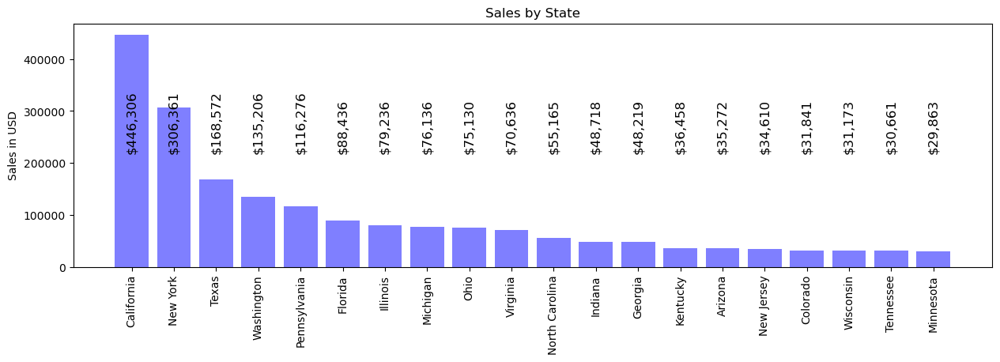

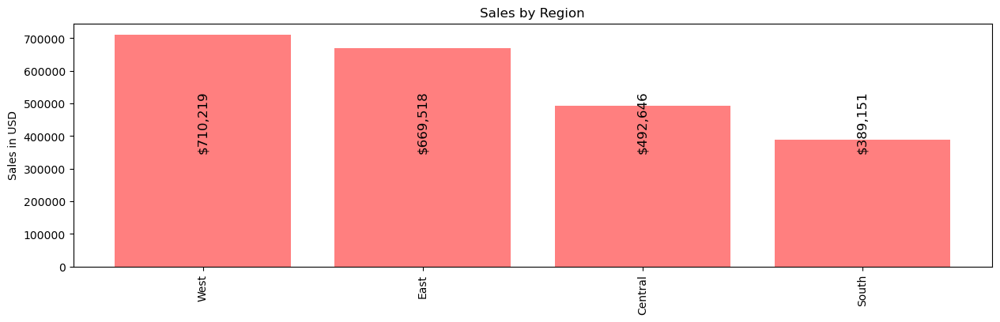

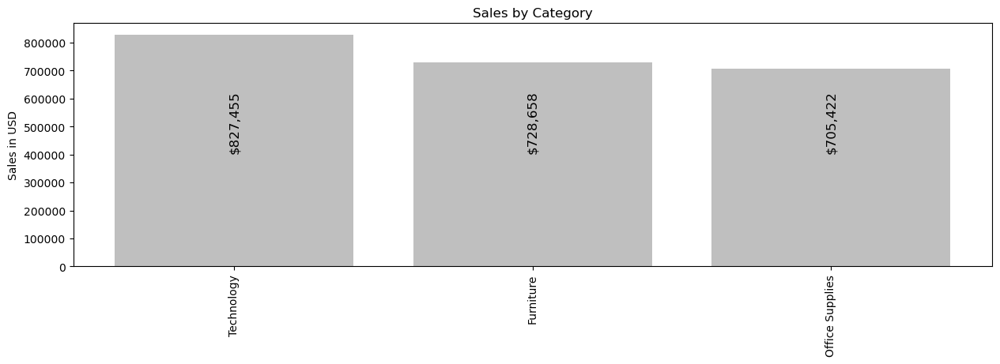

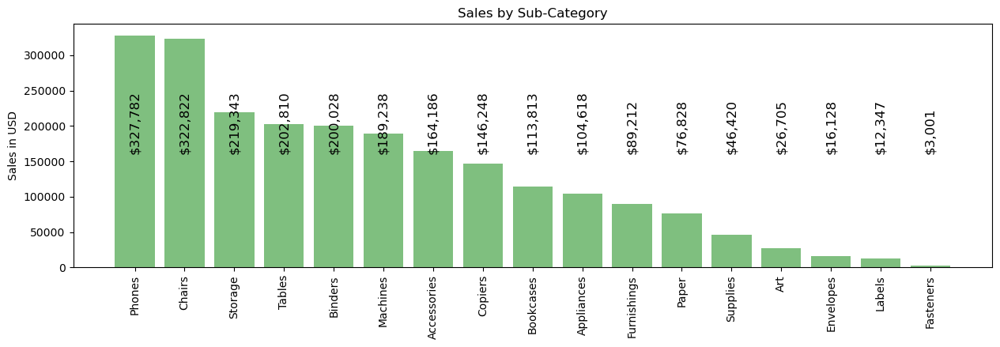

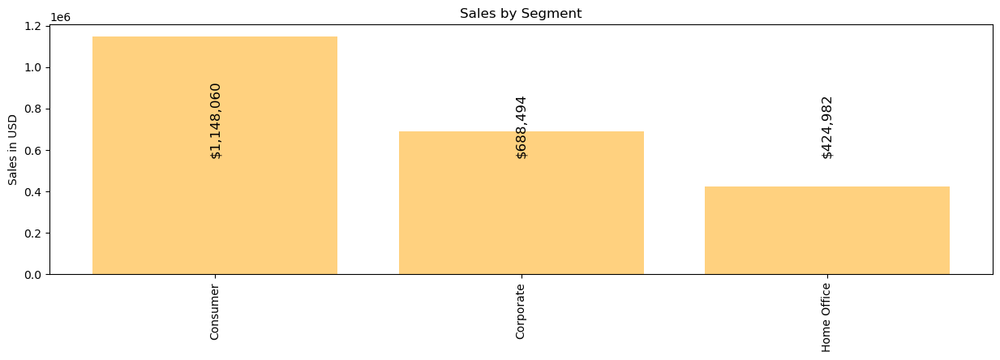

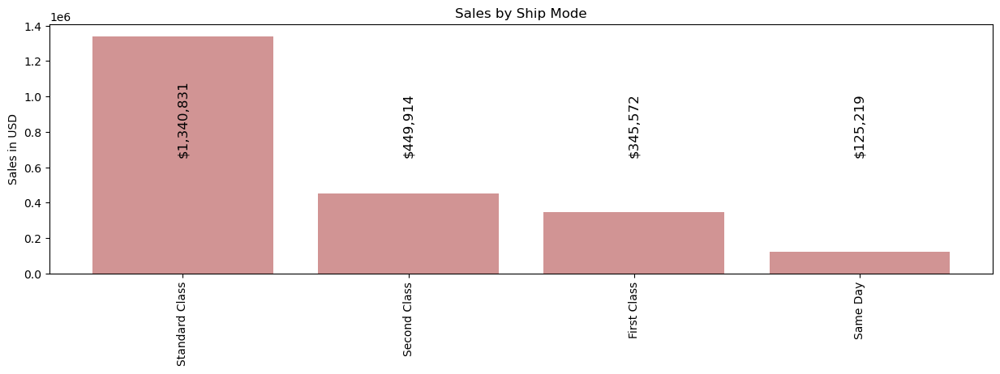

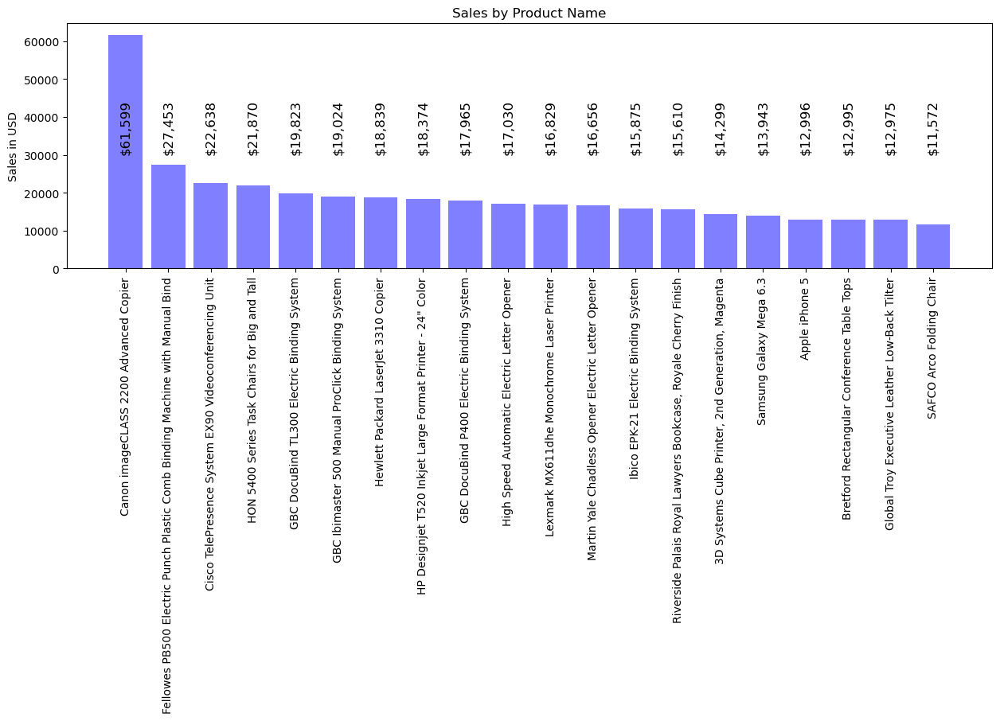

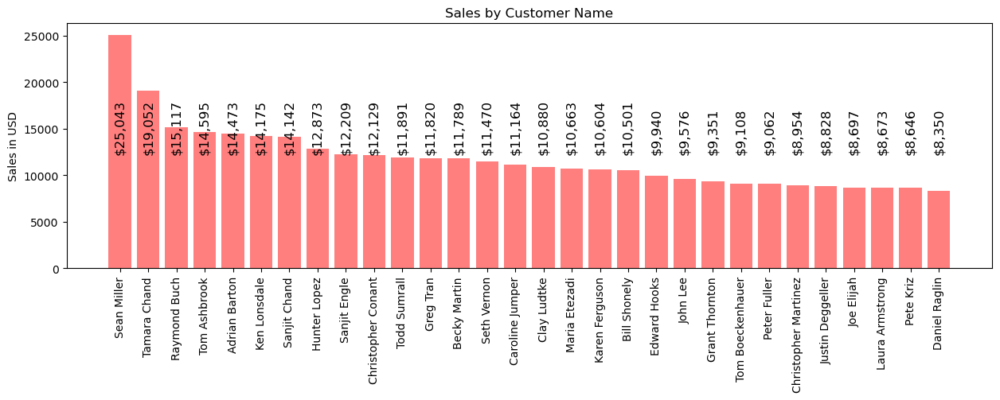

In [19]:
sales_plot_by_group('State',20, color='blue') # plot sales per state and show 20 top states
sales_plot_by_group('Region',color='red') # plot sales per region
sales_plot_by_group('Category',color ='gray') # plot sales by category
sales_plot_by_group('Sub-Category',color='green') # plot sales by sub-category
sales_plot_by_group('Segment',color='orange') # plot sales by segment
sales_plot_by_group('Ship Mode',color='brown') # plot sales by ship mode
sales_plot_by_group('Product Name', 20, color='blue') # plot sales by product name
sales_plot_by_group('Customer Name',30, color='red') # plot sales by customer name

In [20]:
# this function is to plot trend per selected feature


def plot_trend_group(group,size, color='blue'):
    sales_by_group = df.groupby(group)['Sales'].sum() # group sales by group
    sales_by_group.sort_values(ascending= False, inplace=True) # sort values
    sales_by_group.head(size) # select top records
    # subplots with 3 plots per line
    fig, axes = plt.subplots(int(size/3),3, figsize=(15,size), sharex =True, sharey =True)
    fig.suptitle('Sales trend by {}'.format(group), fontsize=18)
    # loop over selected groups in a feature
    for ax,group_name in zip(axes.flat, sales_by_group.index):
        sales_group = df[df[group]==group_name]
        sales_group = sales_group.groupby('month')['Sales'].sum()
        sales_group.index = sales_group.index.to_timestamp()
        ax.tick_params(labelrotation=45)
        ax.set_title(group_name, fontsize = 10)
        ax.plot(sales_group, color=color)
    fig.tight_layout()


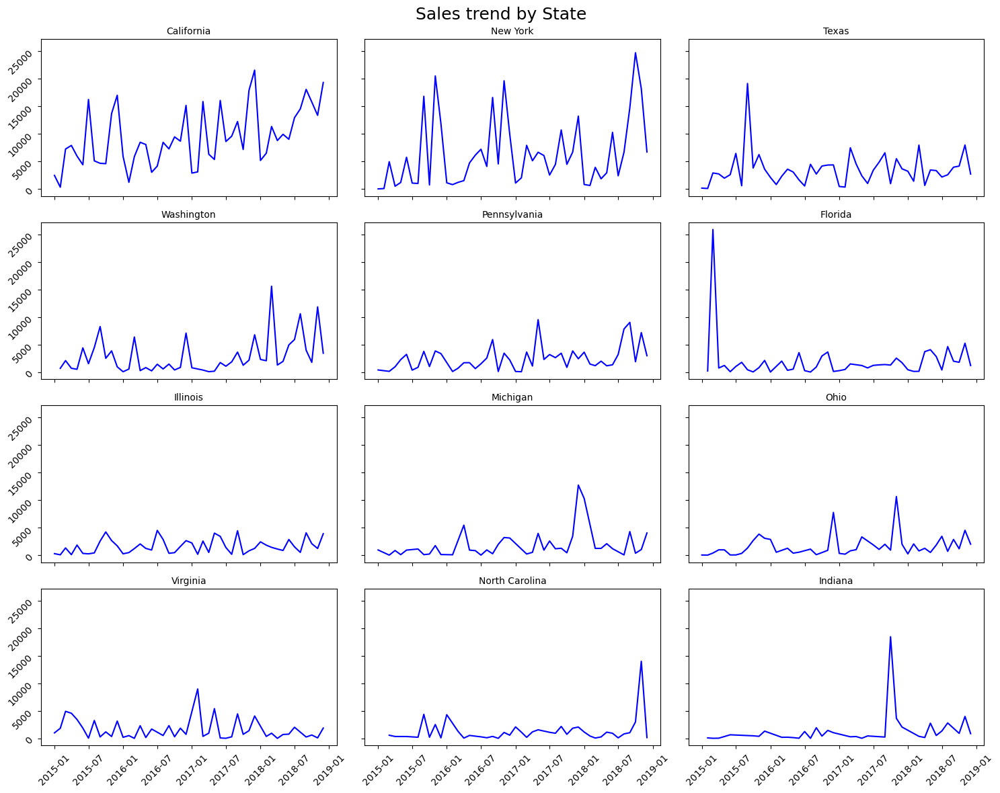

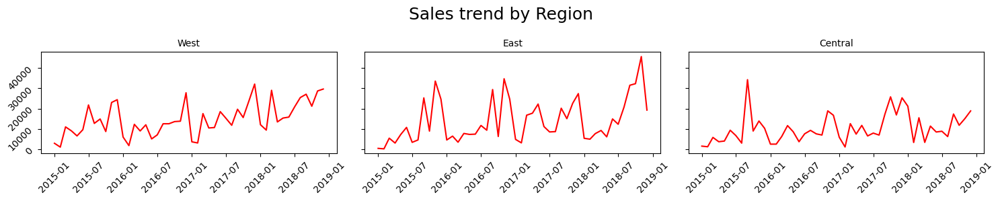

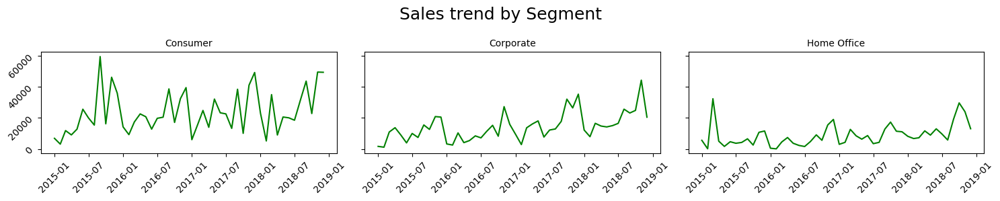

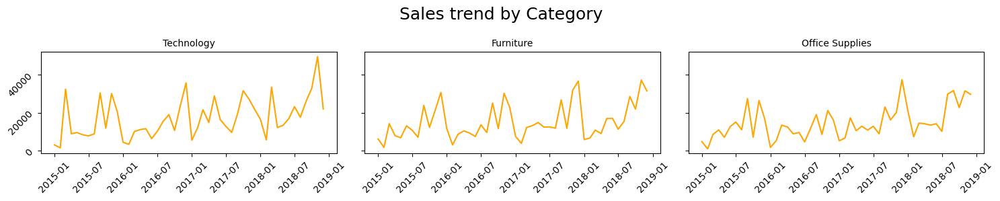

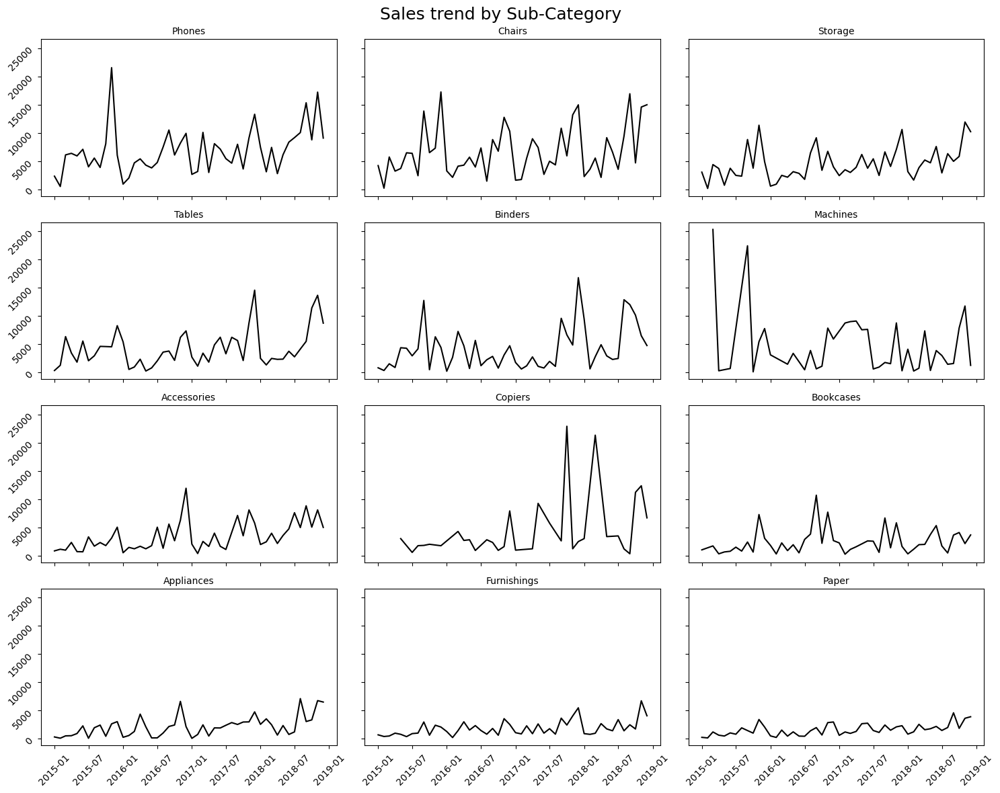

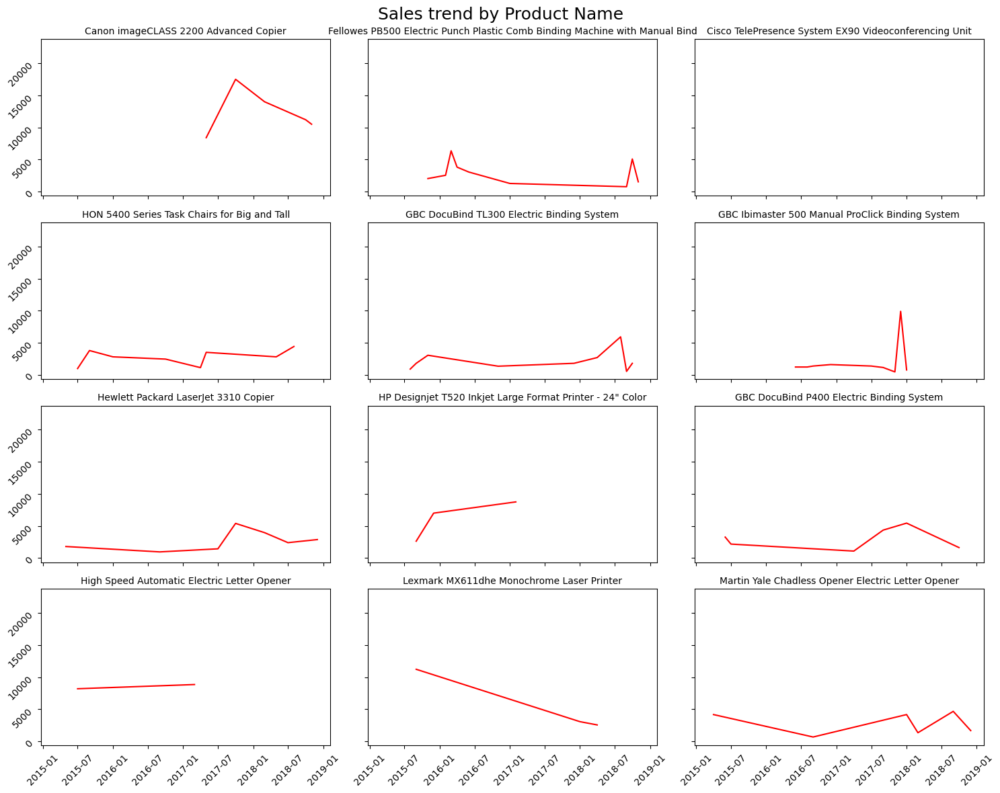

In [21]:
plot_trend_group('State',12) # trend for top 12 states
plot_trend_group('Region',3, 'red') # trend per region
plot_trend_group('Segment',3,'green') # trend per segment
plot_trend_group('Category',3, 'orange') # trend per Category
plot_trend_group('Sub-Category',12, 'black') # trend per Sub-Category
plot_trend_group('Product Name',12,'red') # trend per top 12 Product Name

Monthly Sales ¶
Let's calculate monthly sales

In [22]:
monthly_sales = df.groupby('month')['Sales'].sum()
monthly_sales = pd.DataFrame(monthly_sales)
monthly_sales['time'] = np.arange(len(monthly_sales.index))
monthly_sales.head()

,Sales,time
month,,
2015-01,14205.707,0
2015-02,4519.892,1
2015-03,55205.797,2
2015-04,27906.855,3
2015-05,23644.303,4


In [23]:
#Using seaborn regplot to visualize linear regression for monthly sales

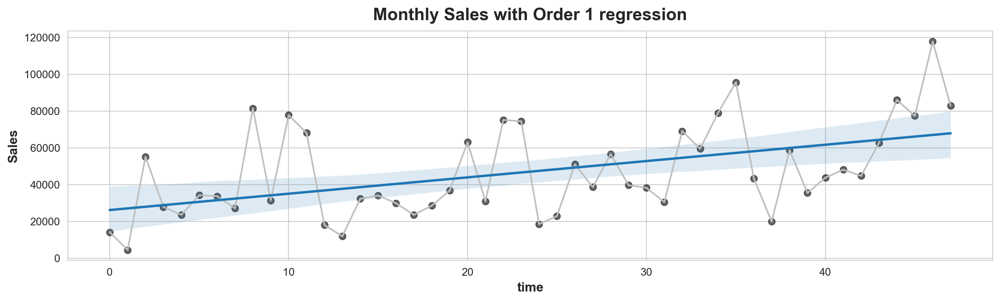

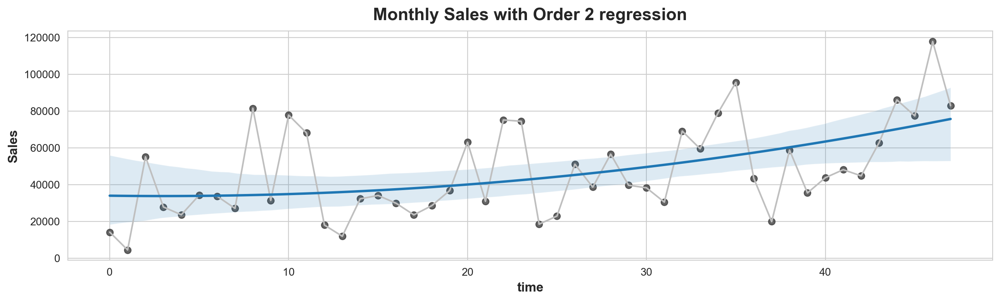

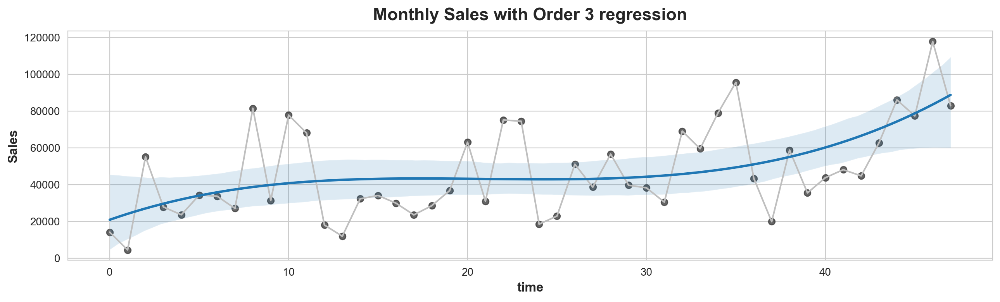

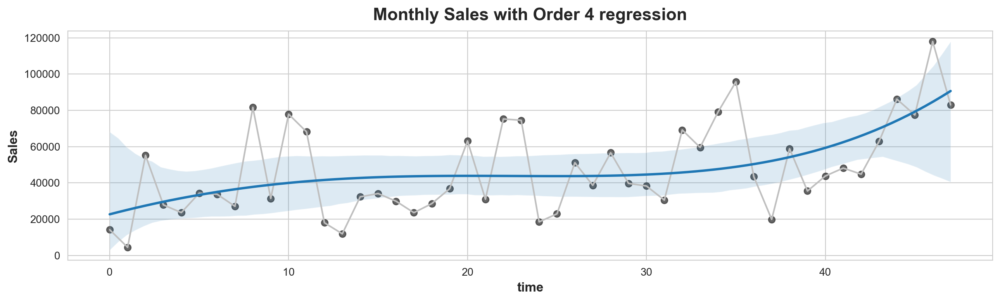

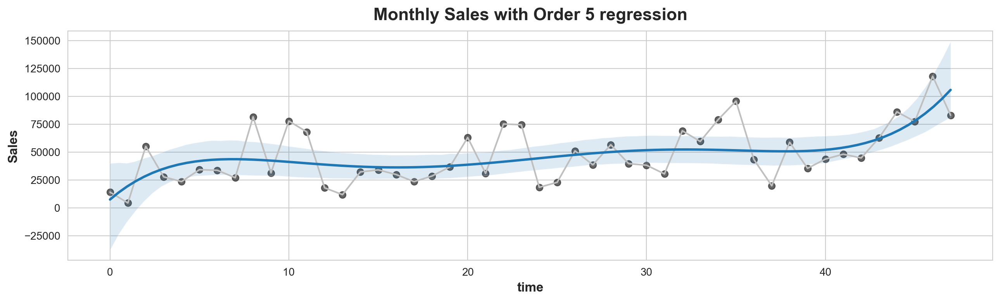

In [24]:
# to plot trend:
# creating a function to plot seaborn regplot for different  regrission orders


def plot_trend(order=1):
    sns.set_style('whitegrid')
    plt.rc('figure', autolayout = True, figsize= (13,4), titlesize = 18, titleweight = 'bold')
    plt.rc("axes", labelweight="bold", labelsize="large", titleweight="bold",titlesize=16,titlepad=10)
    %config InlineBackend.figure_format = 'retina'
    fig, ax = plt.subplots()
    ax.plot(monthly_sales['time'], monthly_sales['Sales'], color='0.75')
    ax = sns.regplot(data=monthly_sales, x='time', y='Sales', scatter_kws=dict(color='0.25'), order=order)
    ax.set_title('Monthly Sales with Order {} regression'.format(order));


# Try regplot between 1 and 5 
for order in range(1,6):
    plot_trend(order)

We can see from linear regression visualization above that sales data seems to have a trend with time. Order 3 and 5 seems to provide more accurate trend

Moving Average 

Using moving average to help visualizing how far the data is from average of 3 months

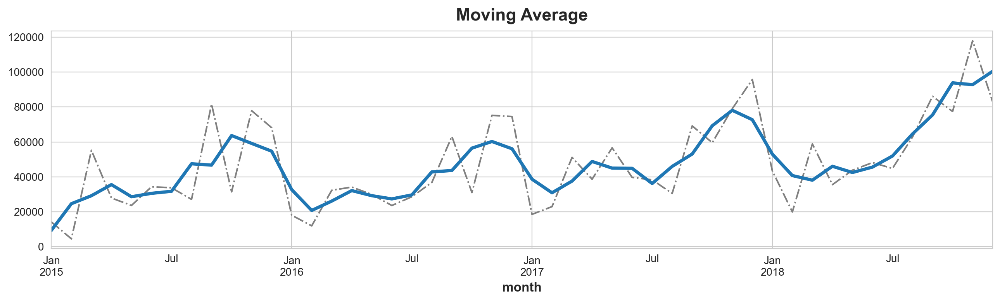

In [25]:
moving_average = monthly_sales['Sales'].rolling(window = 3, center = True, min_periods=1).mean()
moving_average
ax =monthly_sales['Sales'].plot(style="-.", color="0.5")
ax.set_title('Moving Average');
moving_average.plot( ax =ax, linewidth=3);

Prediction Models

Linear Regression 

In [26]:
# use statsmodels to add engineering features for trend and seasonality.

from statsmodels.tsa.deterministic  import DeterministicProcess, CalendarFourier
fourier = CalendarFourier(freq = 'ME', order =4)
dp = DeterministicProcess(
    index=monthly_sales.index,  # dates from the training data
    constant=True,       # dummy feature for the bias (y_intercept)
    order=2,             # the time dummy (trend)
    additional_terms = [fourier],
    seasonal =True,
    drop=True,         
)
X = dp.in_sample()

In [27]:
X.head(13)

,const,trend,trend_squared,"s(2,12)","s(3,12)","s(4,12)","s(5,12)","s(6,12)","s(7,12)","s(8,12)","s(9,12)","s(10,12)","s(11,12)","s(12,12)"
month,,,,,,,,,,,,,,
2015-01,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-02,1.0,2.0,4.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-03,1.0,3.0,9.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-04,1.0,4.0,16.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-05,1.0,5.0,25.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-06,1.0,6.0,36.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-07,1.0,7.0,49.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2015-08,1.0,8.0,64.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2015-09,1.0,9.0,81.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [28]:
# split the data to train and test. Use year 2018 for test data.


y = monthly_sales['Sales']
X_train= X.loc[:'2017-12']
X_test = X.loc['2018-01':]
y_train = y.loc[:'2017-12']
y_test = y.loc['2018-01':]

In [29]:
from sklearn.linear_model import LinearRegression

In [30]:
model = LinearRegression(fit_intercept=False)
model.fit(X_train,y_train)
# pred1 is fitted on X_train, the same data we used for training. 
y_pred1 = pd.Series(model.predict(X_train), index = X_train.index)
# pred2 is fitted on X_test, which is the year 2018
y_pred2 = pd.Series(model.predict(X_test), index = X_test.index)
# additionally we can tak a look at prediction for year 2019
y_forecast = pd.Series(model.predict(dp.out_of_sample(steps = 12)), index = dp.out_of_sample(steps = 12).index)

We will use multiple metrics from sklearn to evaluate predictions of each model.

In [31]:
# define a function to evaluate prediction based on multiple metrics 

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import median_absolute_error
from sklearn.metrics import max_error
from sklearn.metrics import explained_variance_score
from sklearn.metrics import mean_pinball_loss
from sklearn.metrics import d2_tweedie_score
from sklearn.metrics import d2_pinball_score
list_metrics = []
formatl = ['{:<20} ','| {:^6.2f} ','| {:^6.0f} ','| {:^12,.0f}',' | {:^4.2f}',' | {:^6.2f}',' | {:^8.0f}',' | {:^6.0f}',' | {:^6.2f}',' | {:^6.0f}',
          ' | {:^4.2f} |',' {:^4.2f} ']

In [33]:
def evaluate_model(model_name,y_true, y_pred):
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    msle = mean_squared_log_error(y_true,y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    medae = median_absolute_error(y_true, y_pred)
    me = max_error(y_true, y_pred)
    evs = explained_variance_score(y_true, y_pred)
    mpl = mean_pinball_loss(y_true, y_pred)
    d2t = d2_tweedie_score(y_true, y_pred)
    d2p = d2_pinball_score(y_true, y_pred)
    list_metrics.append([model_name,r2,mae,mse,msle,mape, medae,me,evs,mpl,d2t,d2p])
    print('{:^20} | {:^6} | {:^6} | {:^12} | {:^4} | {:^6} | {:^8} | {:^6} | {:^6} | {:^6} | {:^4} | {:^4} '.format(
         'Model','R2','MAE','MSE','MSLE','MAPE','MEDAE','ME','EVS','MPL','D2T','D2P'))
    for metrics in list_metrics:
        for format_, value in zip(formatl, metrics):
            print(format_.format(value), end="")
        print()

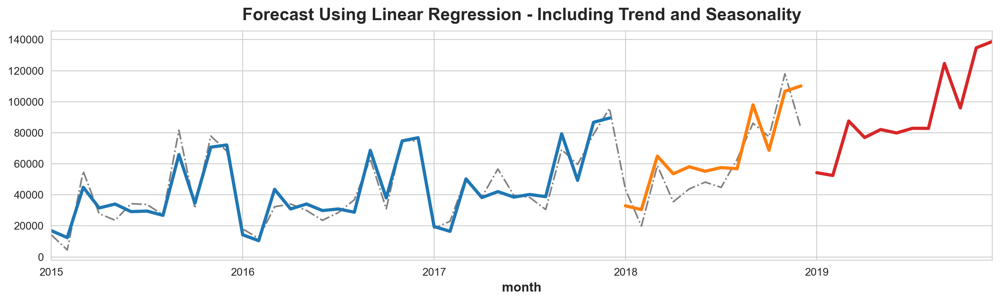

In [34]:
# plot prediction data and compare it with actual train and test data

ax = monthly_sales['Sales'].plot(style="-.", color="0.5", title="Forecast Using Linear Regression - Including Trend and Seasonality")
ax = y_pred1.plot(ax=ax, linewidth=3, label="Trend")
ax = y_pred2.plot(ax =ax, linewidth=3)
ax = y_forecast.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C3')

In [35]:
# r squared is used to measure how far is prediction data from actual train and test data


from sklearn.metrics import r2_score
r_squared = r2_score ( y_train,y_pred1)
print('R2 squared of Prediction for train data: ', r_squared)
print('R2 squared of Prediction for test data (2018): ' ,r2_score (y_test, y_pred2))
evaluate_model('Linear Regression', y_test, y_pred2)

R2 squared of Prediction for train data:  0.9105004682072054
R2 squared of Prediction for test data (2018):  0.7354848558367308
       Model         |   R2   |  MAE   |     MSE      | MSLE |  MAPE  |  MEDAE   |   ME   |  EVS   |  MPL   | D2T  | D2P  
Linear Regression    |  0.74  | 12015  | 176,200,603  | 0.06 |  0.24  |  10889   | 27115  |  0.79  |  6008  | 0.74 | 0.42 


Linear Regression with Ada Boost

In [36]:
X_train= X.loc[:'2017-12']
X_test = X.loc['2018-01':]
y_train = y.loc[:'2017-12']
y_test = y.loc['2018-01':]
from sklearn.ensemble import AdaBoostRegressor
# from sklearn.linear_model import Ridge, Lasso, ElasticNet 
ada = AdaBoostRegressor(n_estimators = 40 , estimator = LinearRegression(), loss='square', learning_rate = 0.5, random_state =21)
ada.fit(X_train,y_train)

y_pred1 = pd.Series(ada.predict(X_train), index = X_train.index)
y_pred2 = pd.Series(ada.predict(X_test), index = X_test.index)
y_forecast = pd.Series(ada.predict(dp.out_of_sample(steps = 12)), index = dp.out_of_sample(steps = 12).index)

r_squared_fit = r2_score(y_train,y_pred1)
r_squared_test = r2_score(y_test,y_pred2)

In [37]:
print(r_squared_fit)
print(r_squared_test)
evaluate_model('Linear & AdaBoost', y_test, y_pred2)

0.9303337615984233
0.7712840424111637
       Model         |   R2   |  MAE   |     MSE      | MSLE |  MAPE  |  MEDAE   |   ME   |  EVS   |  MPL   | D2T  | D2P  
Linear Regression    |  0.74  | 12015  | 176,200,603  | 0.06 |  0.24  |  10889   | 27115  |  0.79  |  6008  | 0.74 | 0.42 
Linear & AdaBoost    |  0.77  | 10450  | 152,353,808  | 0.04 |  0.18  |   9684   | 22623  |  0.77  |  5225  | 0.77 | 0.50 


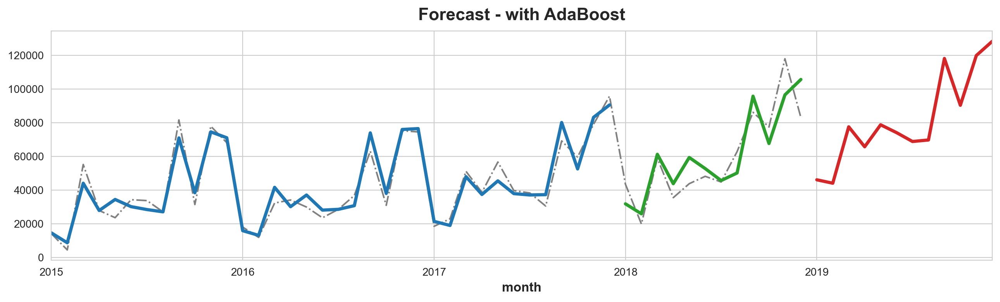

In [38]:
ax = y.plot(style="-.", color="0.5", title="Forecast - with AdaBoost")
ax = y_pred1.plot(ax=ax, linewidth=3, label="Trend")
ax = y_pred2.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C2')
ax = y_forecast.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C3')

Random Forest Regression

In [39]:
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor(n_estimators = 50)
rfr.fit(X_train, y_train)
y_pred1 = pd.Series(rfr.predict(X_train), X_train.index)
y_pred2 = pd.Series(rfr.predict(X_test), X_test.index)
r_squared_fit = r2_score(y_train,y_pred1)
r_squared_test = r2_score(y_test,y_pred2)

print(r_squared_fit)

0.9408393102768746


0.39571338003027967
       Model         |   R2   |  MAE   |     MSE      | MSLE |  MAPE  |  MEDAE   |   ME   |  EVS   |  MPL   | D2T  | D2P  
Linear Regression    |  0.74  | 12015  | 176,200,603  | 0.06 |  0.24  |  10889   | 27115  |  0.79  |  6008  | 0.74 | 0.42 
Linear & AdaBoost    |  0.77  | 10450  | 152,353,808  | 0.04 |  0.18  |   9684   | 22623  |  0.77  |  5225  | 0.77 | 0.50 
Random Forest        |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 


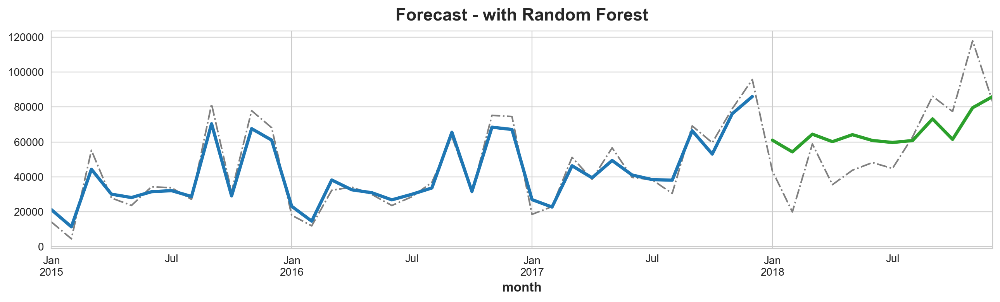

In [40]:
print(r_squared_test)
ax = y.plot(style="-.", color="0.5", title="Forecast - with Random Forest")
ax = y_pred1.plot(ax=ax, linewidth=3, label="Trend")
ax = y_pred2.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C2')
evaluate_model('Random Forest', y_test, y_pred2)

Using Prophet 

23:17:09 - cmdstanpy - INFO - Chain [1] start processing
23:17:10 - cmdstanpy - INFO - Chain [1] done processing


0.9386412943676543
0.39571338003027967
       Model         |   R2   |  MAE   |     MSE      | MSLE |  MAPE  |  MEDAE   |   ME   |  EVS   |  MPL   | D2T  | D2P  
Linear Regression    |  0.74  | 12015  | 176,200,603  | 0.06 |  0.24  |  10889   | 27115  |  0.79  |  6008  | 0.74 | 0.42 
Linear & AdaBoost    |  0.77  | 10450  | 152,353,808  | 0.04 |  0.18  |   9684   | 22623  |  0.77  |  5225  | 0.77 | 0.50 
Random Forest        |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Prophet              |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 


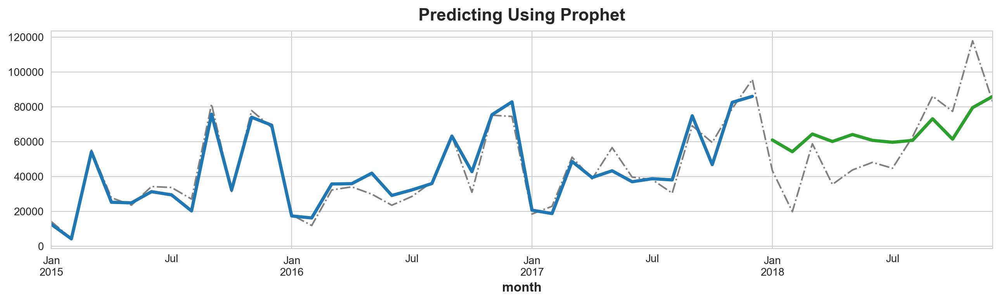

In [47]:
df = pd.read_csv("F:/train.csv")
df['Order Date'] = pd.to_datetime(df['Order Date'], format='%d/%m/%Y')
from prophet import Prophet


# Resample the data to monthly frequency and sum the sales for each month
monthly_data = df.resample('ME', on='Order Date').sum()

# Rename columns as 'ds' and 'y' as required by Prophet
monthly_data.reset_index(inplace=True)
monthly_data = monthly_data.rename(columns={'Order Date': 'ds', 'Sales': 'y'})

data_train = monthly_data.iloc[:-12]
data_test = monthly_data.iloc[-12:]

# Initialize and fit the Prophet model
model = Prophet(
#     growth = 'logistic',
    #growth_cap = 1,
    #seasonality_mode='multiplicative',
#     weekly_seasonality = True,
    seasonality_mode = 'additive',
    seasonality_prior_scale = 10,
               yearly_seasonality=True)
model.fit(data_train)

# Create a future dataframe for the next 12 months
# future = model.make_future_dataframe(periods=12, freq='M')

# Make forecasts for the future
fitted_y = model.predict(data_train)
y_predict = model.predict(data_test)

# Extract the actual data and forecast for the next 12 months
actual_data = data_train['y']
y_pred1 = pd.Series(fitted_y['yhat'][:len(monthly_data)].values,X_train.index)  # Fitted values for the historical datay_pred2 = pd.Series(y_predict['yhat'].values,X_test.index)

ax = y.plot(style="-.", color="0.5", title="Predicting Using Prophet")
ax = y_pred1.plot(ax=ax, linewidth=3, label="Trend")
ax = y_pred2.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C2')

# Display R-squared score for the fitted data
# print(f"R-squared score for fitted data: {r2_fitted:.2f}")
print(r2_score(actual_data,y_pred1))
print(r2_score(data_test['y'],y_pred2))
evaluate_model('Prophet', y_test, y_pred2)

In [62]:
import torch
from torch import nn
import torch.nn.functional as F

In [65]:
class LSTM(nn.Module):
    def __init__(self, input_size = 1, hidden_layer_size = 48, num_layers=3, output_size=1, dropout = 0.0):
        super().__init__()
        self.hidden_layer_size = hidden_layer_size
        self.lstm = nn.LSTM(input_size, hidden_layer_size, num_layers = num_layers)
        self.linear = nn.Linear(hidden_layer_size, output_size)
        
    def forward(self, input_seq):
        lstm_out, _ = self.lstm(input_seq.view(len(input_seq),1,-1))
        predictions = self.linear(lstm_out[:,-1,:])
        return predictions[-1]
model = LSTM()
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(),lr=0.001)
print(model)
df2 = pd.read_csv("F:/train.csv")
df2['Order Date'] = pd.to_datetime(df2['Order Date'], format='%d/%m/%Y')
monthly_data = df2.resample('ME', on='Order Date').sum()

all_data = monthly_data['Sales'].values
train_data = all_data[:-12] 
test_data = all_data[-24:-12]
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(-1, 1))
train_data_normalized = scaler.fit_transform(train_data.reshape(-1, 1))
test_data_normalized = scaler.transform(test_data.reshape(-1, 1))
train_data_normalized = torch.FloatTensor(train_data_normalized).view(-1)
test_data_normalized = torch.FloatTensor(test_data_normalized).view(-1)
def create_inout_sequences(input_data, window):
    inout_seq = []
    L = len(input_data)
    for i in range(L-window):
        train_seq = input_data[i:i+window]
        train_label = input_data[i+window:i+window+1]
        inout_seq.append((train_seq ,train_label))
    return inout_seq
inout_seq = create_inout_sequences(train_data_normalized,12)



LSTM(
  (lstm): LSTM(1, 48, num_layers=3)
  (linear): Linear(in_features=48, out_features=1, bias=True)
)


In [66]:
for i in range(200):
    for seq, labels in inout_seq:
        optimizer.zero_grad()
        y_pred = model(seq)
        single_loss = loss_function(y_pred, labels)
        single_loss.backward()
        optimizer.step()
    if i%25 == 1:
        print(f'epoch: {i:3} loss: {single_loss.item():10.8f}')
print(f'epoch: {i:3} loss: {single_loss.item():10.8f}')

epoch:   1 loss: 1.27111816
epoch:  26 loss: 0.57700819
epoch:  51 loss: 0.02156697
epoch:  76 loss: 0.00014385
epoch: 101 loss: 0.01263841
epoch: 126 loss: 0.00000688
epoch: 151 loss: 0.00009128
epoch: 176 loss: 0.00063725
epoch: 199 loss: 0.00231790


In [67]:
test_input = test_data_normalized[-12:].tolist()
model.eval()
for i in range(12):
    seq = torch.FloatTensor(test_input[-12:])
    with torch.no_grad():
        test_input.append(model(seq).item())

0.11195206712342332
       Model         |   R2   |  MAE   |     MSE      | MSLE |  MAPE  |  MEDAE   |   ME   |  EVS   |  MPL   | D2T  | D2P  
Linear Regression    |  0.74  | 12015  | 176,200,603  | 0.06 |  0.24  |  10889   | 27115  |  0.79  |  6008  | 0.74 | 0.42 
Linear & AdaBoost    |  0.77  | 10450  | 152,353,808  | 0.04 |  0.18  |   9684   | 22623  |  0.77  |  5225  | 0.77 | 0.50 
Random Forest        |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Prophet              |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Ada-['Category']     |  0.79  | 10561  | 139,915,121  | 0.05 |  0.20  |  10077   | 23358  |  0.80  |  5281  | 0.79 | 0.49 
Ada-['Segment']      |  0.78  | 10888  | 146,936,649  | 0.05 |  0.21  |  10259   | 24632  |  0.79  |  5444  | 0.78 | 0.48 
Ada-['Region']       |  0.76  | 11105  | 157,257,034  | 0.05 |  0.22  |   9627   | 26985  |  0.80  |  5553  | 0.76 | 0.

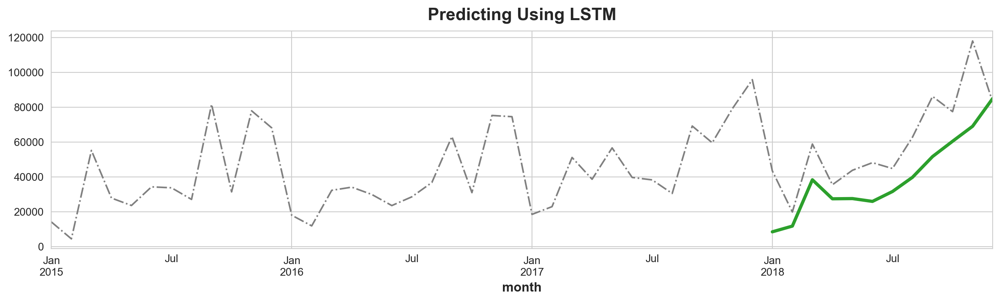

In [68]:
prediction2 =scaler.inverse_transform(np.array(test_input[12:]).reshape(-1, 1))

x = np.arange(len(train_data)+1,len(train_data) + 13,1)
y_pred2 = pd.Series(prediction2[:,0], X_test.index)
ax = y.plot(style="-.", color="0.5", title="Predicting Using LSTM")
# ax = y_pred1.plot(ax=ax, linewidth=3, label="Trend")
ax = y_pred2.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C2')
print(r2_score(y_test,y_pred2))
evaluate_model('LSTM', y_test, y_pred2)

Prediction for Earch Features 

Linear Regression with AdaBoost for different features 

In [53]:
df = pd.read_csv("F:/train.csv")
df['Order Date'] = pd.to_datetime(df['Order Date'], format='%d/%m/%Y')
df['month'] = pd.to_datetime(df['Order Date']).dt.to_period('M')

In [54]:
from statsmodels.tsa.deterministic  import DeterministicProcess, CalendarFourier
fourier = CalendarFourier(freq = 'ME', order =4)
dp = DeterministicProcess(
    index=df.groupby('month')['Sales'].sum().index,  # dates from the training data
    constant=True,       # dummy feature for the bias (y_intercept)
    order=2,             # the time dummy (trend)
    additional_terms = [fourier],
    seasonal =True,
    drop=True,           # drop terms if necessary to avoid collinearity
)
X = dp.in_sample()

In [55]:
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import r2_score
from sklearn.ensemble import AdaBoostRegressor

def additional_features_forecast(additional_feature, df,X):
    df_sc = df.groupby(['month'] + additional_feature)['Sales'].sum()
    df_sc = df_sc.reset_index()

    df_sc = df_sc.set_index(['month']+ additional_feature).unstack(additional_feature).fillna(0)
    y = df_sc.loc[:,'Sales']

    X_train= X.loc[:'2017-12']
    X_test = X.loc['2018-01':]
    y_train = y.loc[:'2017-12']
    y_test = y.loc['2018-01':]

    ada = AdaBoostRegressor(n_estimators = 200 , estimator = LinearRegression(), loss='exponential', learning_rate = 0.0001, random_state =21)
    model = MultiOutputRegressor(ada)
    model.fit(X_train,y_train)

    y_fit = pd.DataFrame(model.predict(X_train), index = X_train.index.to_timestamp(),columns = y.columns)
    y_pred = pd.DataFrame(model.predict(X_test), index = X_test.index.to_timestamp(), columns = y.columns)
    y_forecast2 = pd.DataFrame(model.predict(dp.out_of_sample(steps = 12)), index = dp.out_of_sample(steps = 12).index, columns = y.columns)

    fig, axes = plt.subplots(len(y.columns)+1,1, figsize = (12,(len(y.columns)+1)*2), sharex=True, constrained_layout=True)

    fig.suptitle('Sales Forecast for Each {}'.format(additional_feature[0]), fontsize=20, color='blue')

    for ax, feature in zip(axes, y.columns):
        ax.plot(y.index.to_timestamp(), y[feature], color="0.5", linestyle='dashed')
        ax.plot(y_fit[feature])
        ax.plot(y_pred[feature])
        ax.plot(y_forecast2[feature])
        ax.set_title(f'{feature}, test accuracy: {r2_score(y_test[feature],y_pred[feature]):.2f}', fontsize=10)

    axes[-1].plot(y.index.to_timestamp(), y.sum(axis=1), color="0.5", linestyle='dashed')
    axes[-1].plot(y_fit.sum(axis=1))
    axes[-1].plot(y_pred.sum(axis=1))
    axes[-1].plot(y_forecast2.sum(axis=1))
    axes[-1].set_title(f'Sum of all {additional_feature[0]}, test accuracy: {r2_score(y_test.sum(axis=1),y_pred.sum(axis=1)):.2f}', 
                       fontsize=12, color='green')

    plt.show()
    evaluate_model(f'Ada-{additional_feature}', y_test.sum(axis=1),y_pred.sum(axis=1))
    

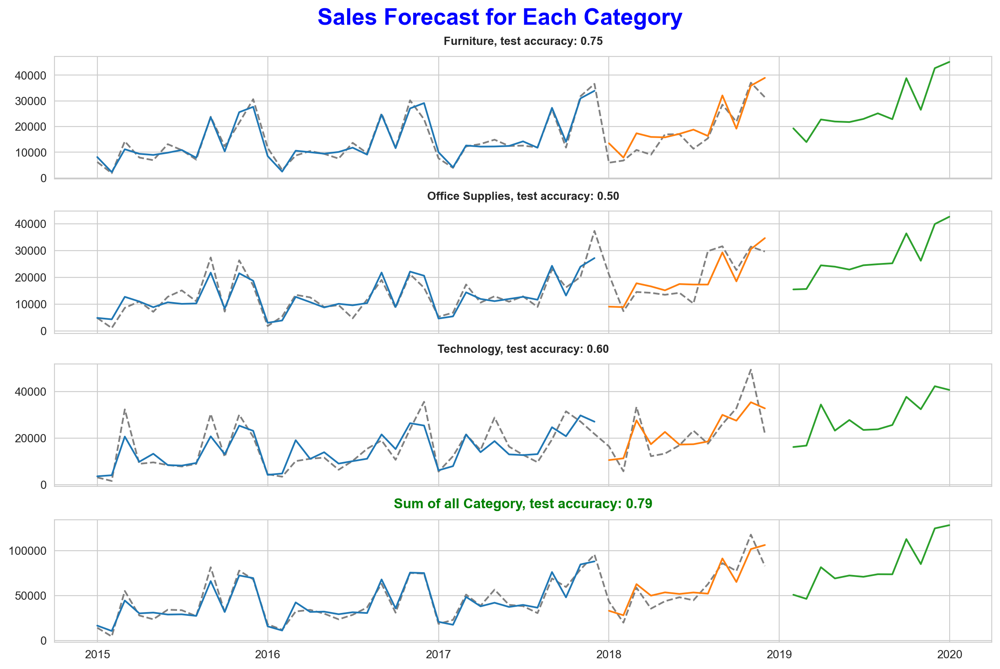

       Model         |   R2   |  MAE   |     MSE      | MSLE |  MAPE  |  MEDAE   |   ME   |  EVS   |  MPL   | D2T  | D2P  
Linear Regression    |  0.74  | 12015  | 176,200,603  | 0.06 |  0.24  |  10889   | 27115  |  0.79  |  6008  | 0.74 | 0.42 
Linear & AdaBoost    |  0.77  | 10450  | 152,353,808  | 0.04 |  0.18  |   9684   | 22623  |  0.77  |  5225  | 0.77 | 0.50 
Random Forest        |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Prophet              |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Ada-['Category']     |  0.79  | 10561  | 139,915,121  | 0.05 |  0.20  |  10077   | 23358  |  0.80  |  5281  | 0.79 | 0.49 


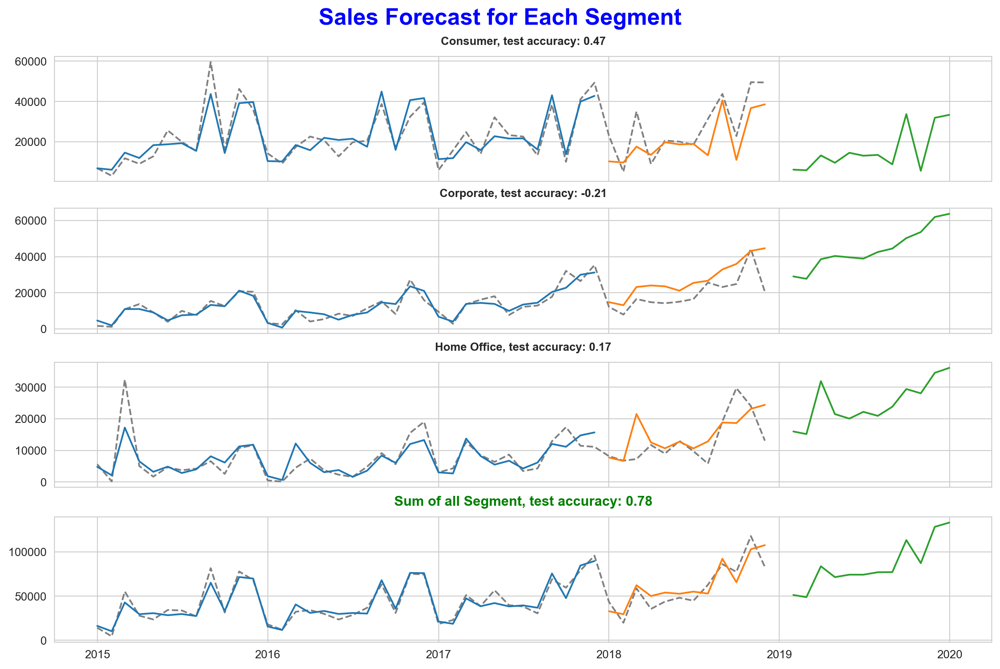

       Model         |   R2   |  MAE   |     MSE      | MSLE |  MAPE  |  MEDAE   |   ME   |  EVS   |  MPL   | D2T  | D2P  
Linear Regression    |  0.74  | 12015  | 176,200,603  | 0.06 |  0.24  |  10889   | 27115  |  0.79  |  6008  | 0.74 | 0.42 
Linear & AdaBoost    |  0.77  | 10450  | 152,353,808  | 0.04 |  0.18  |   9684   | 22623  |  0.77  |  5225  | 0.77 | 0.50 
Random Forest        |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Prophet              |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Ada-['Category']     |  0.79  | 10561  | 139,915,121  | 0.05 |  0.20  |  10077   | 23358  |  0.80  |  5281  | 0.79 | 0.49 
Ada-['Segment']      |  0.78  | 10888  | 146,936,649  | 0.05 |  0.21  |  10259   | 24632  |  0.79  |  5444  | 0.78 | 0.48 


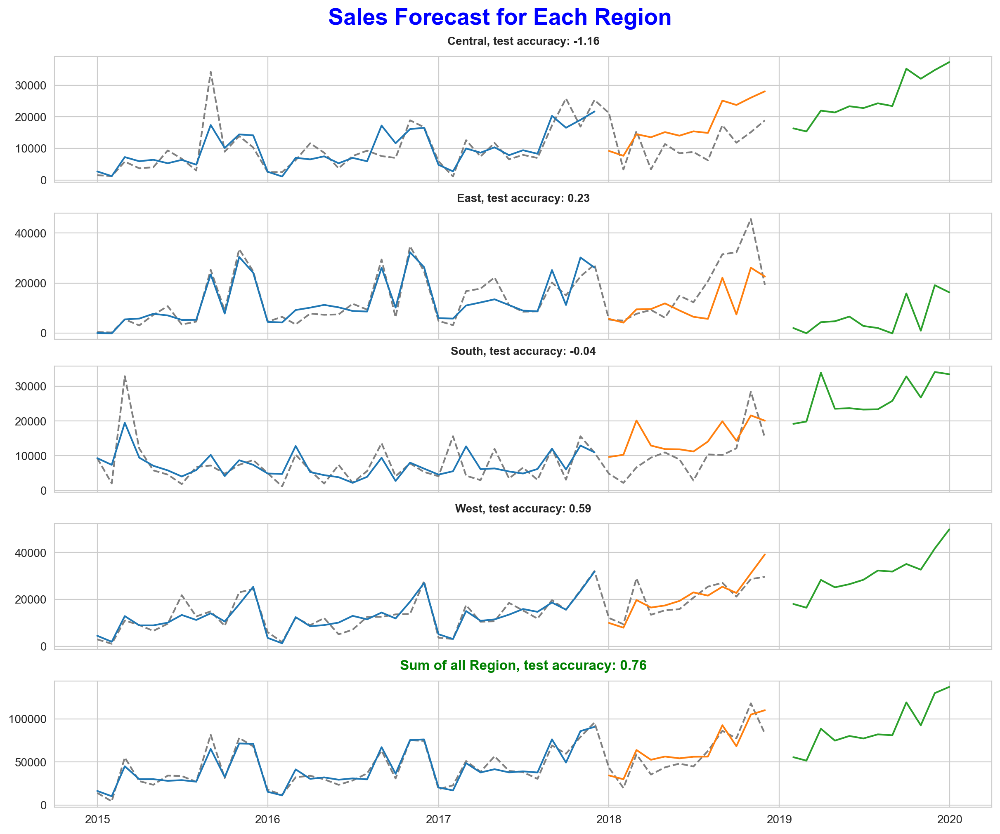

       Model         |   R2   |  MAE   |     MSE      | MSLE |  MAPE  |  MEDAE   |   ME   |  EVS   |  MPL   | D2T  | D2P  
Linear Regression    |  0.74  | 12015  | 176,200,603  | 0.06 |  0.24  |  10889   | 27115  |  0.79  |  6008  | 0.74 | 0.42 
Linear & AdaBoost    |  0.77  | 10450  | 152,353,808  | 0.04 |  0.18  |   9684   | 22623  |  0.77  |  5225  | 0.77 | 0.50 
Random Forest        |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Prophet              |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Ada-['Category']     |  0.79  | 10561  | 139,915,121  | 0.05 |  0.20  |  10077   | 23358  |  0.80  |  5281  | 0.79 | 0.49 
Ada-['Segment']      |  0.78  | 10888  | 146,936,649  | 0.05 |  0.21  |  10259   | 24632  |  0.79  |  5444  | 0.78 | 0.48 
Ada-['Region']       |  0.76  | 11105  | 157,257,034  | 0.05 |  0.22  |   9627   | 26985  |  0.80  |  5553  | 0.76 | 0.47 


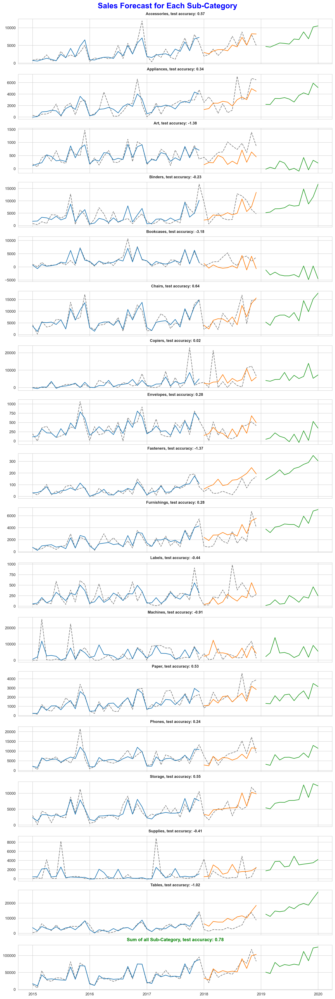

       Model         |   R2   |  MAE   |     MSE      | MSLE |  MAPE  |  MEDAE   |   ME   |  EVS   |  MPL   | D2T  | D2P  
Linear Regression    |  0.74  | 12015  | 176,200,603  | 0.06 |  0.24  |  10889   | 27115  |  0.79  |  6008  | 0.74 | 0.42 
Linear & AdaBoost    |  0.77  | 10450  | 152,353,808  | 0.04 |  0.18  |   9684   | 22623  |  0.77  |  5225  | 0.77 | 0.50 
Random Forest        |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Prophet              |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Ada-['Category']     |  0.79  | 10561  | 139,915,121  | 0.05 |  0.20  |  10077   | 23358  |  0.80  |  5281  | 0.79 | 0.49 
Ada-['Segment']      |  0.78  | 10888  | 146,936,649  | 0.05 |  0.21  |  10259   | 24632  |  0.79  |  5444  | 0.78 | 0.48 
Ada-['Region']       |  0.76  | 11105  | 157,257,034  | 0.05 |  0.22  |   9627   | 26985  |  0.80  |  5553  | 0.76 | 0.47 
Ada-['Sub-Catego

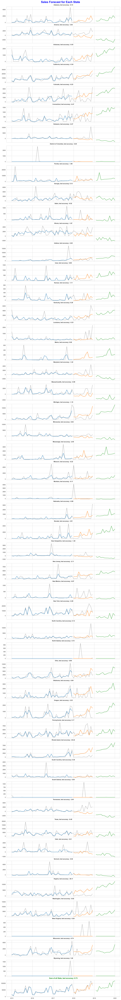

       Model         |   R2   |  MAE   |     MSE      | MSLE |  MAPE  |  MEDAE   |   ME   |  EVS   |  MPL   | D2T  | D2P  
Linear Regression    |  0.74  | 12015  | 176,200,603  | 0.06 |  0.24  |  10889   | 27115  |  0.79  |  6008  | 0.74 | 0.42 
Linear & AdaBoost    |  0.77  | 10450  | 152,353,808  | 0.04 |  0.18  |   9684   | 22623  |  0.77  |  5225  | 0.77 | 0.50 
Random Forest        |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Prophet              |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Ada-['Category']     |  0.79  | 10561  | 139,915,121  | 0.05 |  0.20  |  10077   | 23358  |  0.80  |  5281  | 0.79 | 0.49 
Ada-['Segment']      |  0.78  | 10888  | 146,936,649  | 0.05 |  0.21  |  10259   | 24632  |  0.79  |  5444  | 0.78 | 0.48 
Ada-['Region']       |  0.76  | 11105  | 157,257,034  | 0.05 |  0.22  |   9627   | 26985  |  0.80  |  5553  | 0.76 | 0.47 
Ada-['Sub-Catego

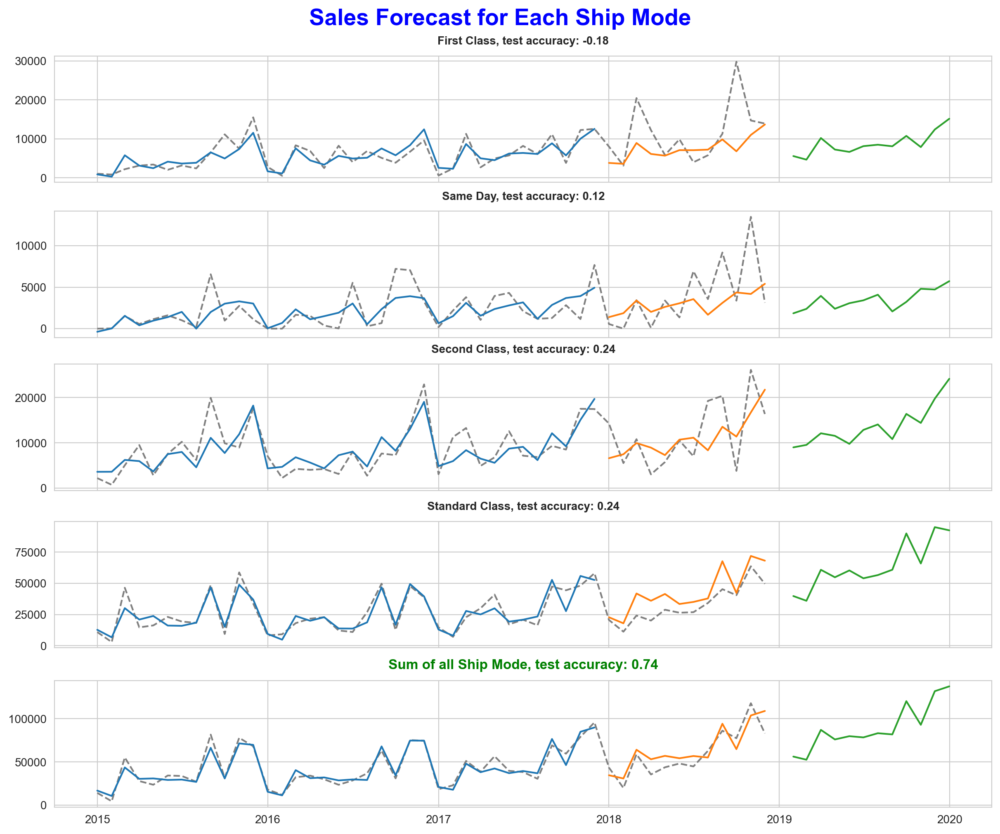

       Model         |   R2   |  MAE   |     MSE      | MSLE |  MAPE  |  MEDAE   |   ME   |  EVS   |  MPL   | D2T  | D2P  
Linear Regression    |  0.74  | 12015  | 176,200,603  | 0.06 |  0.24  |  10889   | 27115  |  0.79  |  6008  | 0.74 | 0.42 
Linear & AdaBoost    |  0.77  | 10450  | 152,353,808  | 0.04 |  0.18  |   9684   | 22623  |  0.77  |  5225  | 0.77 | 0.50 
Random Forest        |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Prophet              |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Ada-['Category']     |  0.79  | 10561  | 139,915,121  | 0.05 |  0.20  |  10077   | 23358  |  0.80  |  5281  | 0.79 | 0.49 
Ada-['Segment']      |  0.78  | 10888  | 146,936,649  | 0.05 |  0.21  |  10259   | 24632  |  0.79  |  5444  | 0.78 | 0.48 
Ada-['Region']       |  0.76  | 11105  | 157,257,034  | 0.05 |  0.22  |   9627   | 26985  |  0.80  |  5553  | 0.76 | 0.47 
Ada-['Sub-Catego

In [56]:
features = ['Category', 'Segment','Region','Sub-Category','State','Ship Mode']
for feature_ in features:
    additional_features_forecast([feature_],df,X)

Prophet for different features

In [60]:
df = pd.read_csv("F:/train.csv")
df['Order Date'] = pd.to_datetime(df['Order Date'], format='%d/%m/%Y')
from prophet import Prophet
import logging
logging.disable(logging.CRITICAL)
monthly = df.resample('ME', on='Order Date').sum()
monthly_train = monthly.iloc[:-12]
monthly_test = monthly.iloc[-12:]

def forecast_feature_prophet(feature):
    fig, axes = plt.subplots(len(df[feature].unique())+1,1, 
                             figsize = (12,(len(df[feature].unique())+1)*2), 
                             sharex=True, constrained_layout=True)

    for ax, value in zip(axes, df[feature].unique()):
        df_sc = df[df[feature]==value]

        
        # Resample the data to monthly frequency and sum the sales for each month
        monthly_data = df_sc.resample('ME', on='Order Date').sum()

        # Rename columns as 'ds' and 'y' as required by Prophet
        monthly_data.reset_index(inplace=True)
        monthly_data = monthly_data.rename(columns={'Order Date': 'ds', 'Sales': 'y'})

        data_train = monthly_data.iloc[:-12]
        data_test = monthly_data.iloc[-12:]
        # Initialize and fit the Prophet model
        model = Prophet(
            seasonality_mode = 'additive',
            seasonality_prior_scale = 10,
                       yearly_seasonality=True)
        model.fit(data_train)



        # Make forecasts for the future
        fitted_y = model.predict(data_train)
        y_predict = model.predict(data_test)
        
        if 'total_pred1' in locals():
            total_pred1 = total_pred1.add(fitted_y['yhat'], fill_value = 0)
            total_pred2 = total_pred2.add(y_predict['yhat'], fill_value = 0)
        else:
            total_pred1 = fitted_y['yhat']
            total_pred2 = y_predict['yhat']
        
        ax.plot(monthly_data['ds'], monthly_data['y'], color="0.5", linestyle='dashed')
        ax.plot(fitted_y['ds'], fitted_y['yhat'])
        ax.plot(X_test.index, y_predict['yhat'])
        r2_score_test = r2_score(data_test['y'],y_predict['yhat'])
        ax.set_title(f'Prophet prediction for {value},test accuracy: {r2_score_test:.2f}',
                     fontsize=10)
        
        axes[-1].plot( monthly.index,monthly['Sales'], linestyle="dashed", color="0.5",linewidth=2)
    axes[-1].plot(monthly_train.index, total_pred1, linewidth=3, label="Trend")
    axes[-1].plot(monthly_test.index, total_pred2, linewidth=3, label="Trend Forecast", color='C2')
    axes[-1].set_title(f'Sum of all {feature}, test accuracy: {r2_score(y_test,total_pred2):.2f}', 
                       fontsize=12, color='green')
    plt.show()
    evaluate_model(f'Prophet-{feature}', y_test, total_pred2)
    

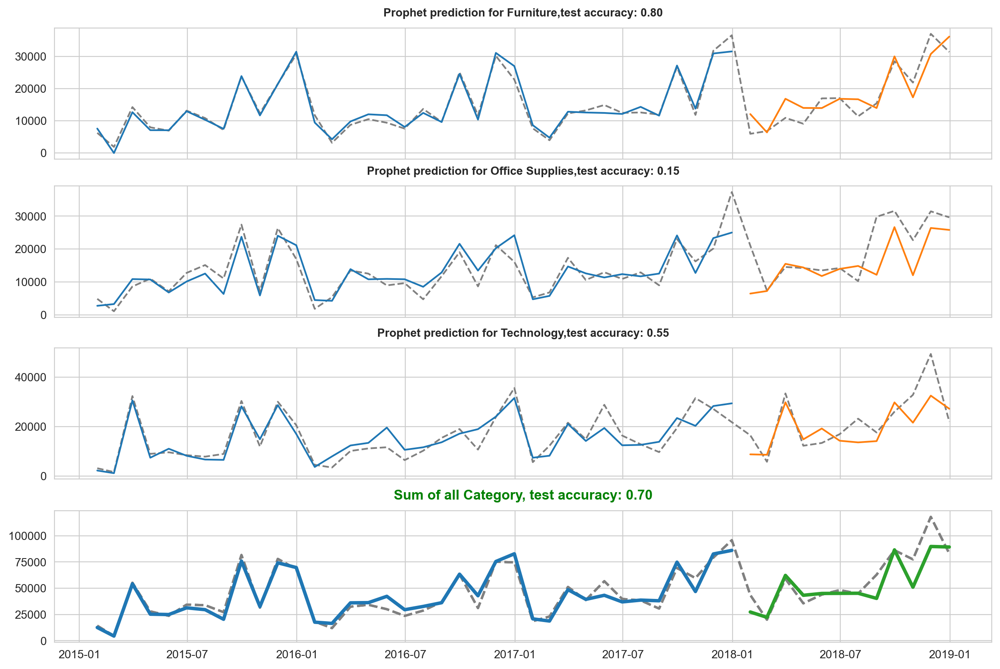

       Model         |   R2   |  MAE   |     MSE      | MSLE |  MAPE  |  MEDAE   |   ME   |  EVS   |  MPL   | D2T  | D2P  
Linear Regression    |  0.74  | 12015  | 176,200,603  | 0.06 |  0.24  |  10889   | 27115  |  0.79  |  6008  | 0.74 | 0.42 
Linear & AdaBoost    |  0.77  | 10450  | 152,353,808  | 0.04 |  0.18  |   9684   | 22623  |  0.77  |  5225  | 0.77 | 0.50 
Random Forest        |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Prophet              |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Ada-['Category']     |  0.79  | 10561  | 139,915,121  | 0.05 |  0.20  |  10077   | 23358  |  0.80  |  5281  | 0.79 | 0.49 
Ada-['Segment']      |  0.78  | 10888  | 146,936,649  | 0.05 |  0.21  |  10259   | 24632  |  0.79  |  5444  | 0.78 | 0.48 
Ada-['Region']       |  0.76  | 11105  | 157,257,034  | 0.05 |  0.22  |   9627   | 26985  |  0.80  |  5553  | 0.76 | 0.47 
Ada-['Sub-Catego

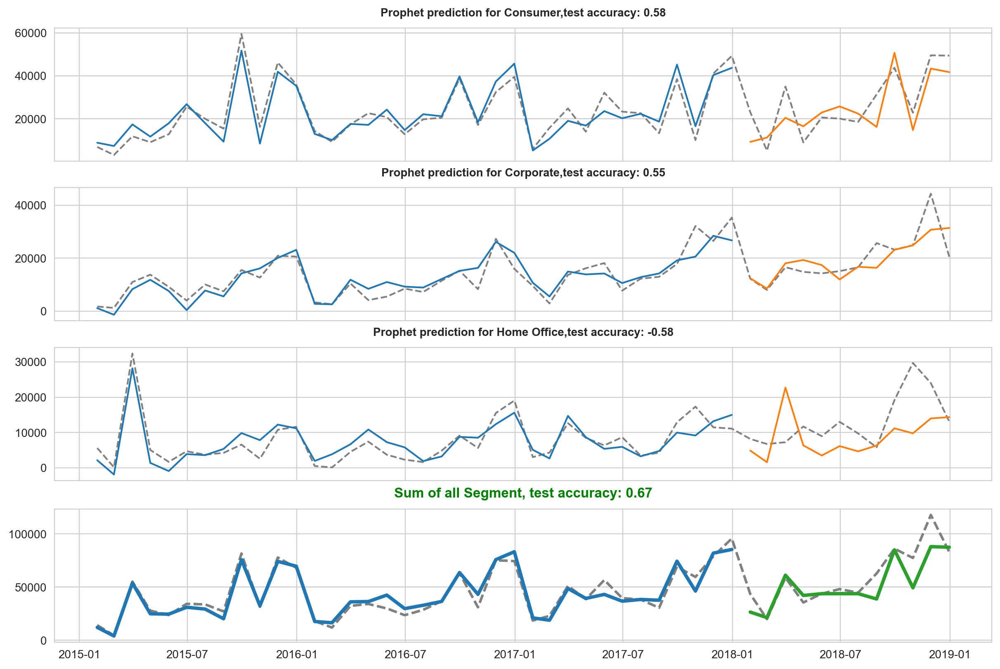

       Model         |   R2   |  MAE   |     MSE      | MSLE |  MAPE  |  MEDAE   |   ME   |  EVS   |  MPL   | D2T  | D2P  
Linear Regression    |  0.74  | 12015  | 176,200,603  | 0.06 |  0.24  |  10889   | 27115  |  0.79  |  6008  | 0.74 | 0.42 
Linear & AdaBoost    |  0.77  | 10450  | 152,353,808  | 0.04 |  0.18  |   9684   | 22623  |  0.77  |  5225  | 0.77 | 0.50 
Random Forest        |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Prophet              |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Ada-['Category']     |  0.79  | 10561  | 139,915,121  | 0.05 |  0.20  |  10077   | 23358  |  0.80  |  5281  | 0.79 | 0.49 
Ada-['Segment']      |  0.78  | 10888  | 146,936,649  | 0.05 |  0.21  |  10259   | 24632  |  0.79  |  5444  | 0.78 | 0.48 
Ada-['Region']       |  0.76  | 11105  | 157,257,034  | 0.05 |  0.22  |   9627   | 26985  |  0.80  |  5553  | 0.76 | 0.47 
Ada-['Sub-Catego

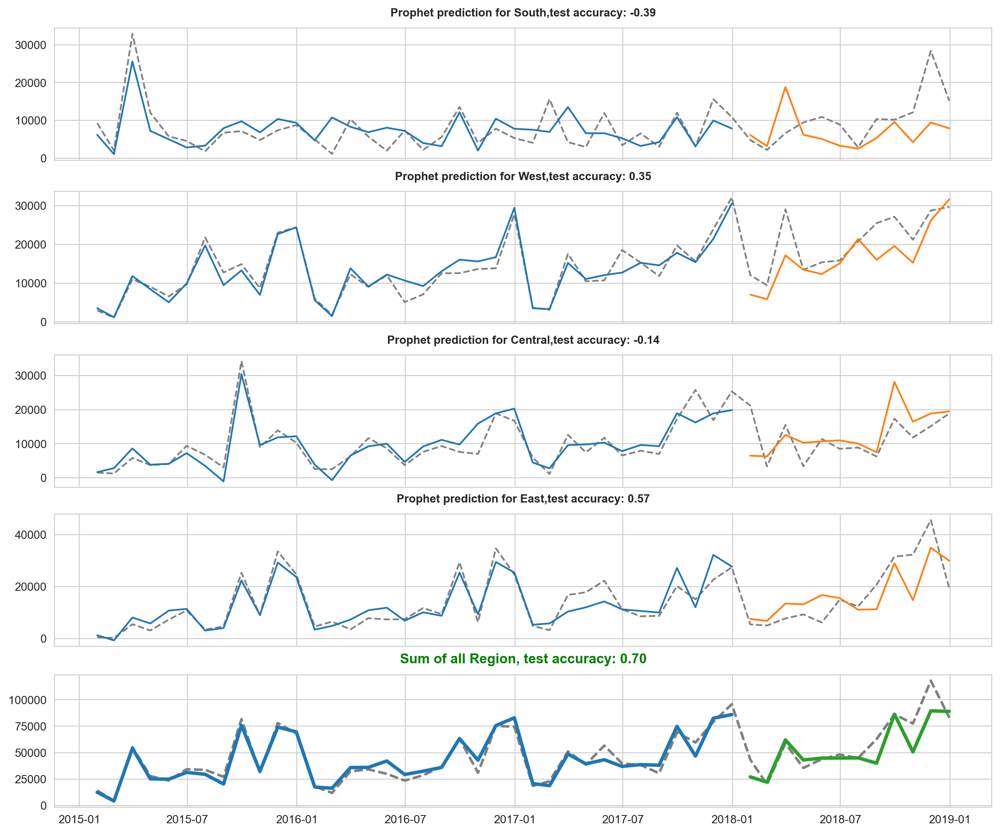

       Model         |   R2   |  MAE   |     MSE      | MSLE |  MAPE  |  MEDAE   |   ME   |  EVS   |  MPL   | D2T  | D2P  
Linear Regression    |  0.74  | 12015  | 176,200,603  | 0.06 |  0.24  |  10889   | 27115  |  0.79  |  6008  | 0.74 | 0.42 
Linear & AdaBoost    |  0.77  | 10450  | 152,353,808  | 0.04 |  0.18  |   9684   | 22623  |  0.77  |  5225  | 0.77 | 0.50 
Random Forest        |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Prophet              |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Ada-['Category']     |  0.79  | 10561  | 139,915,121  | 0.05 |  0.20  |  10077   | 23358  |  0.80  |  5281  | 0.79 | 0.49 
Ada-['Segment']      |  0.78  | 10888  | 146,936,649  | 0.05 |  0.21  |  10259   | 24632  |  0.79  |  5444  | 0.78 | 0.48 
Ada-['Region']       |  0.76  | 11105  | 157,257,034  | 0.05 |  0.22  |   9627   | 26985  |  0.80  |  5553  | 0.76 | 0.47 
Ada-['Sub-Catego

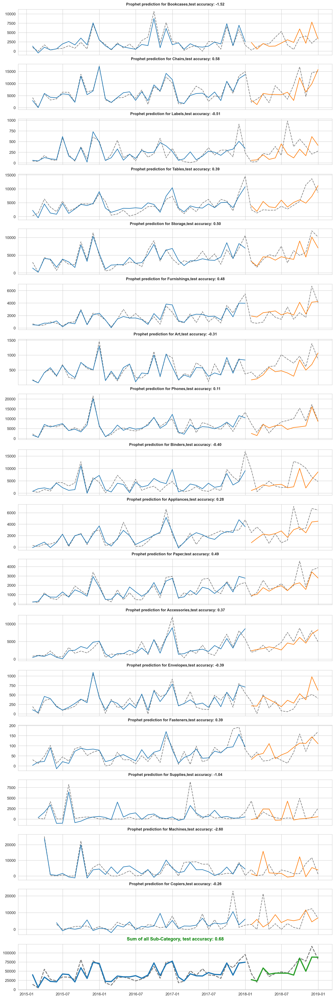

       Model         |   R2   |  MAE   |     MSE      | MSLE |  MAPE  |  MEDAE   |   ME   |  EVS   |  MPL   | D2T  | D2P  
Linear Regression    |  0.74  | 12015  | 176,200,603  | 0.06 |  0.24  |  10889   | 27115  |  0.79  |  6008  | 0.74 | 0.42 
Linear & AdaBoost    |  0.77  | 10450  | 152,353,808  | 0.04 |  0.18  |   9684   | 22623  |  0.77  |  5225  | 0.77 | 0.50 
Random Forest        |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Prophet              |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Ada-['Category']     |  0.79  | 10561  | 139,915,121  | 0.05 |  0.20  |  10077   | 23358  |  0.80  |  5281  | 0.79 | 0.49 
Ada-['Segment']      |  0.78  | 10888  | 146,936,649  | 0.05 |  0.21  |  10259   | 24632  |  0.79  |  5444  | 0.78 | 0.48 
Ada-['Region']       |  0.76  | 11105  | 157,257,034  | 0.05 |  0.22  |   9627   | 26985  |  0.80  |  5553  | 0.76 | 0.47 
Ada-['Sub-Catego

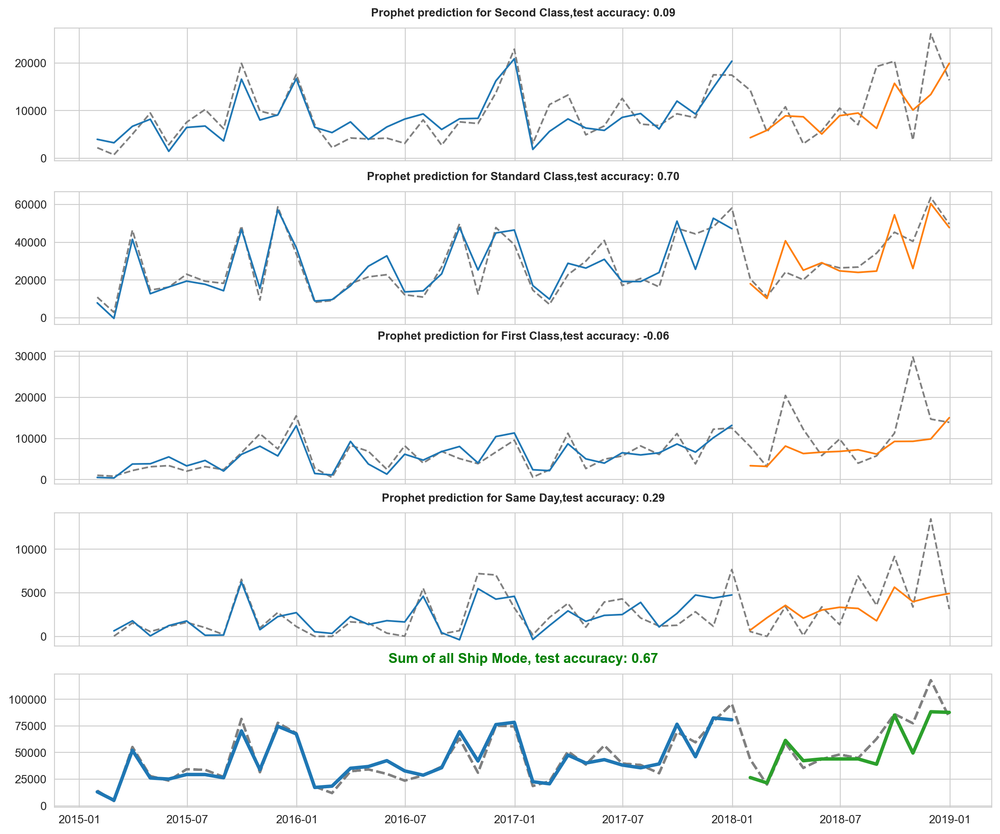

       Model         |   R2   |  MAE   |     MSE      | MSLE |  MAPE  |  MEDAE   |   ME   |  EVS   |  MPL   | D2T  | D2P  
Linear Regression    |  0.74  | 12015  | 176,200,603  | 0.06 |  0.24  |  10889   | 27115  |  0.79  |  6008  | 0.74 | 0.42 
Linear & AdaBoost    |  0.77  | 10450  | 152,353,808  | 0.04 |  0.18  |   9684   | 22623  |  0.77  |  5225  | 0.77 | 0.50 
Random Forest        |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Prophet              |  0.40  | 16860  | 402,531,458  | 0.16 |  0.39  |  15428   | 38353  |  0.44  |  8430  | 0.40 | 0.19 
Ada-['Category']     |  0.79  | 10561  | 139,915,121  | 0.05 |  0.20  |  10077   | 23358  |  0.80  |  5281  | 0.79 | 0.49 
Ada-['Segment']      |  0.78  | 10888  | 146,936,649  | 0.05 |  0.21  |  10259   | 24632  |  0.79  |  5444  | 0.78 | 0.48 
Ada-['Region']       |  0.76  | 11105  | 157,257,034  | 0.05 |  0.22  |   9627   | 26985  |  0.80  |  5553  | 0.76 | 0.47 
Ada-['Sub-Catego

In [61]:
features = ['Category', 'Segment','Region','Sub-Category','Ship Mode']
for feature_ in features:
    forecast_feature_prophet(feature_)